In [1]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

## Data imports

In [32]:
# merged_count_matrices pcs, no covariate correction
file_path = '/scratch/hb-functionalgenomics/projects/gut-bulk/ongoing/2024-02-07-GutPublicRNASeq/5-expressieQC/output/combined_samples_PCs_with_study.txt'
data = pd.read_csv(file_path, sep="\t")

In [2]:
# 10-final_pca geneEXP PCs, covariate correction
file_path2 = '/scratch/hb-functionalgenomics/projects/gut-bulk/ongoing/2024-02-07-GutPublicRNASeq/5-expressieQC/all_alignment_output/10_final_pca/geneExp-PCA_PCs.txt'
data2 = pd.read_csv(file_path2, sep="\t")

In [3]:
# 9-covariate_correction
file_path3 = '/scratch/hb-functionalgenomics/projects/gut-bulk/ongoing/2024-02-07-GutPublicRNASeq/5-expressieQC/all_alignment_output/9_covariate_correction/covariates_PCs.txt'
data3 = pd.read_csv(file_path2, sep="\t")

In [4]:
data2

,Sample,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100
0,SRR7632902,-0.011939,0.043412,0.022025,-0.008816,-0.008195,-0.014778,0.017743,0.045129,0.004434,...,0.018998,-0.061685,-0.047883,-0.032791,-0.055162,-0.126272,0.009905,-0.060808,-0.008300,-0.065711
1,SRR8774219,-0.018242,-0.052048,-0.008603,0.061479,-0.048409,0.054534,-0.039579,0.033556,-0.018122,...,-0.014999,-0.016406,-0.008042,-0.001051,0.013713,0.017109,-0.020151,-0.012176,0.064797,0.027046
2,SRR5176723,0.029328,-0.015459,-0.030633,-0.024396,-0.036826,-0.064657,0.031339,0.013650,-0.055008,...,-0.006201,0.007580,0.007067,0.081739,-0.028907,0.017631,-0.078802,-0.047270,-0.092046,0.047107
3,SRR6467570,0.043385,-0.038580,0.003384,-0.019388,0.036411,-0.023163,-0.022265,0.010364,-0.026086,...,-0.012237,-0.002996,0.043073,-0.036127,-0.064500,0.019389,-0.058984,0.000556,-0.014926,-0.006287
4,SRR7632915,0.012662,0.008637,0.067155,0.023767,0.007797,0.000404,-0.034710,0.005398,-0.044227,...,0.085560,0.067594,-0.008489,-0.066895,0.051491,0.020363,-0.023869,0.038954,0.044012,-0.043658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710,SRR7632806,-0.034667,-0.009532,-0.014750,-0.032136,0.024797,0.009648,-0.030612,0.029873,-0.050405,...,0.065415,0.090391,-0.059102,0.020841,-0.031023,0.027396,0.003891,-0.032866,-0.034499,-0.003634
711,SRR8774235,-0.025757,-0.071314,0.014827,0.059221,-0.040028,0.011823,-0.047971,0.014477,0.012333,...,0.004323,-0.018453,0.027213,-0.005799,0.019347,0.014177,-0.036737,0.014223,-0.030000,0.004786
712,SRR2314029,0.010905,-0.000788,0.055278,-0.033254,-0.025054,0.016181,-0.044239,0.019720,-0.045544,...,-0.004960,-0.061995,0.026594,0.056185,0.039100,-0.077353,-0.055493,-0.025609,0.014436,-0.013176
713,SRR3107944,-0.065112,0.020380,-0.014974,-0.029005,0.053174,-0.023093,-0.016009,-0.043477,0.069865,...,-0.021449,0.002965,-0.025352,0.026276,-0.008002,0.019877,-0.004730,0.019460,0.003613,-0.004164


## Graphs

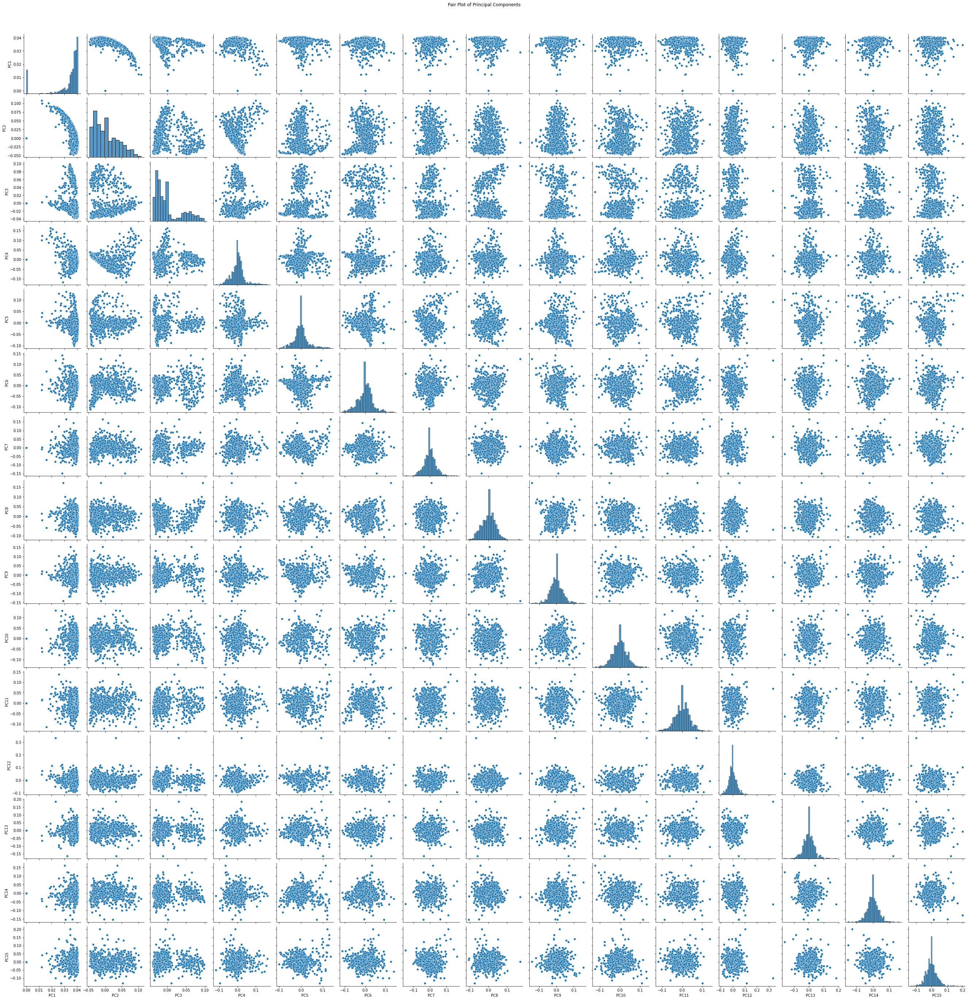

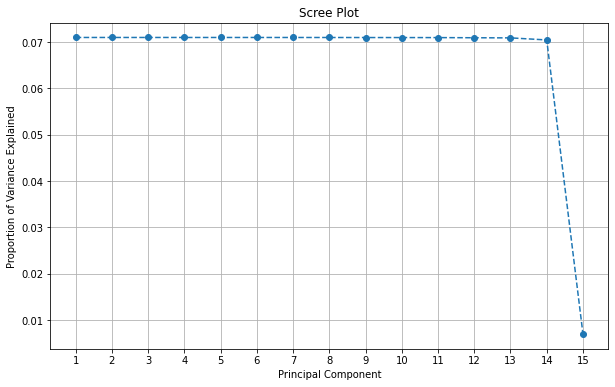

In [33]:
# Extract principal components
pc_columns = data.columns[-15:]
pcs = data[pc_columns]

# Plot principal components against each other
sns.pairplot(pcs)
plt.suptitle('Pair Plot of Principal Components', y=1.02)
plt.show()

# Create a scree plot
explained_variance = pcs.var().sort_values(ascending=False)
explained_variance_ratio = explained_variance / explained_variance.sum()

plt.figure(figsize=(10, 6))
plt.plot(range(1, 16), explained_variance_ratio, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.xticks(range(1, 16))
plt.grid()
plt.show()

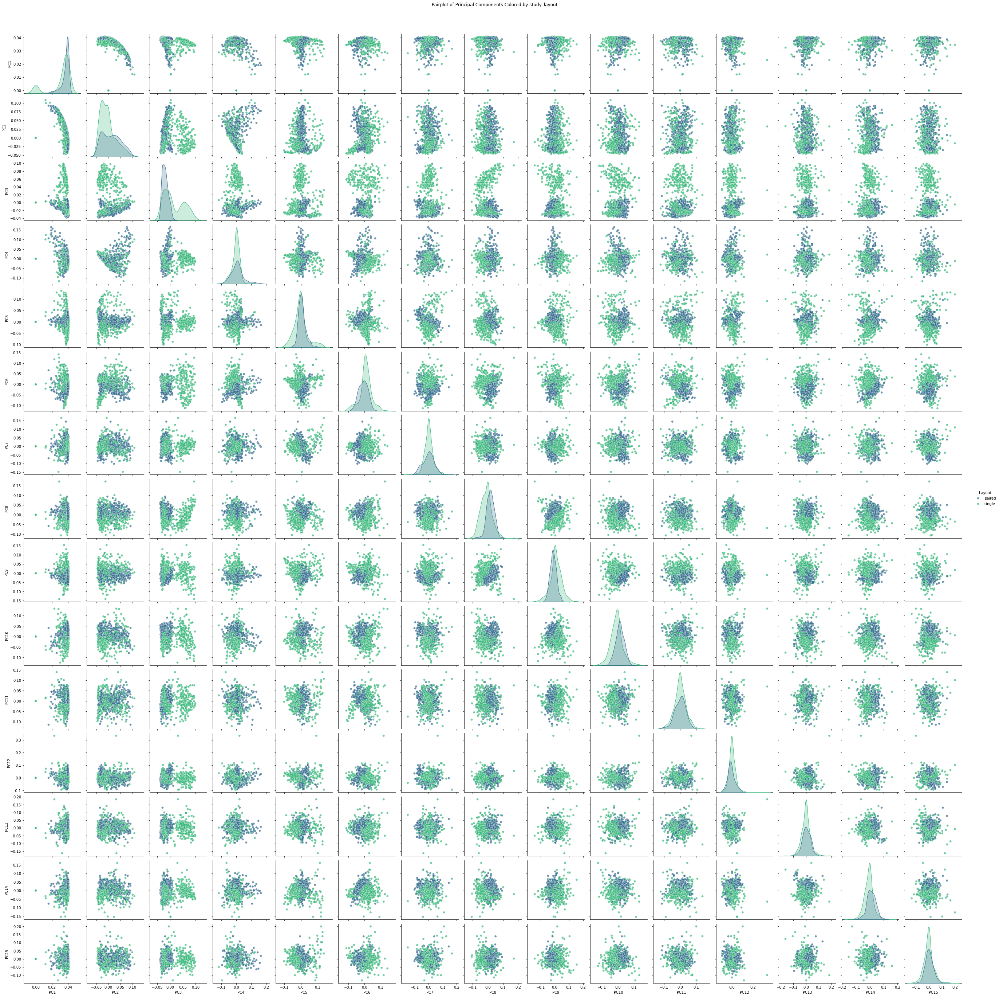

In [74]:
# Extract the relevant columns: study names and principal components
study_names = data.iloc[:, 0]
study_layout = data.iloc[:, 1]
pcs = data.iloc[:, -15:]

# Combine the study names with the principal components into a single DataFrame for Seaborn
pcs['Layout'] = study_layout

# Create a pairplot with Seaborn
pairplot = sns.pairplot(pcs, hue='Layout', palette='viridis', plot_kws={'alpha':0.7})

# Set the background color to white
pairplot.fig.patch.set_facecolor('white')
for ax in pairplot.axes.flatten():
    ax.set_facecolor('white')

# Customize plot
pairplot.fig.suptitle('Pairplot of Principal Components Colored by study_layout', y=1.02)
plt.show()

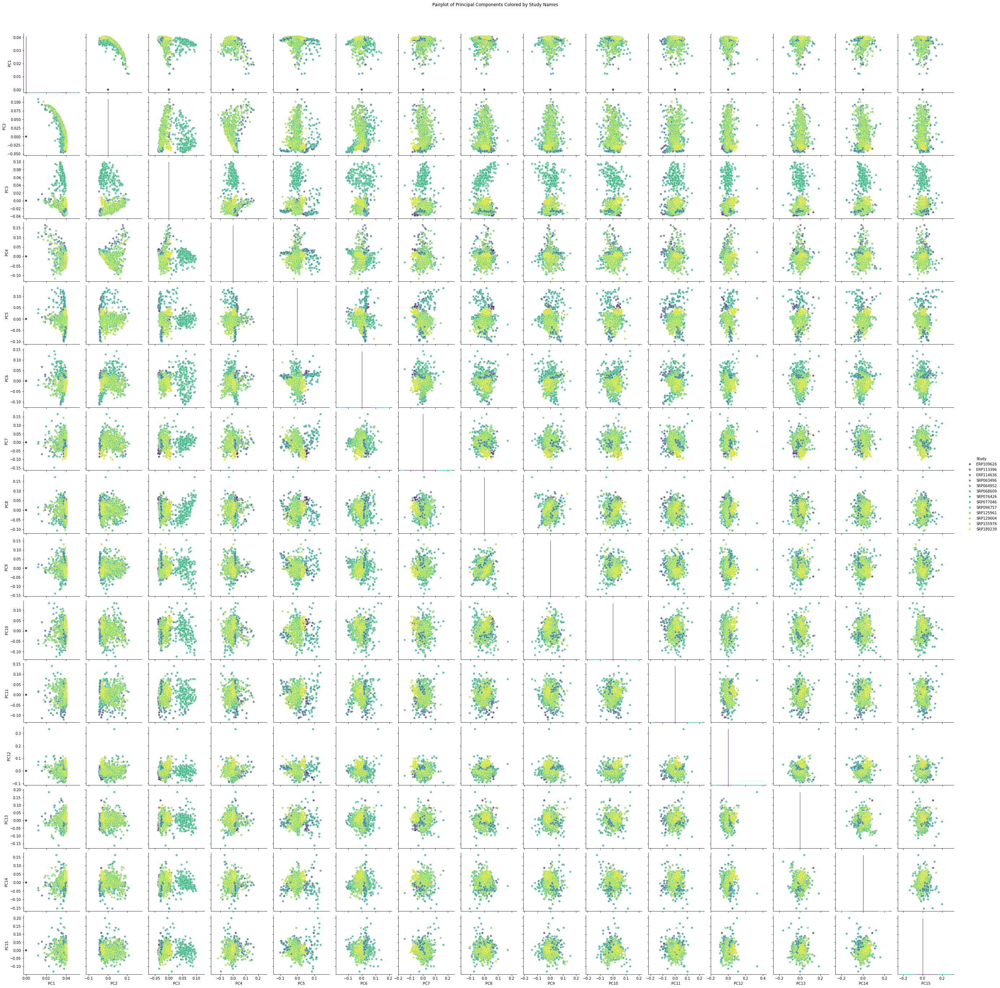

In [75]:
# Extract the relevant columns: study names and principal components
study_names = data.iloc[:, 0]
pcs = data.iloc[:, -15:]

# Combine the study names with the principal components into a single DataFrame for Seaborn
pcs['Study'] = study_names

# Create a pairplot with Seaborn
pairplot = sns.pairplot(pcs, hue='Study', palette='viridis', plot_kws={'alpha':0.7})


# Set the background color to white
pairplot.fig.patch.set_facecolor('white')
for ax in pairplot.axes.flatten():
    ax.set_facecolor('white')

# Customize plot
pairplot.fig.suptitle('Pairplot of Principal Components Colored by Study Names', y=1.02)
plt.show()

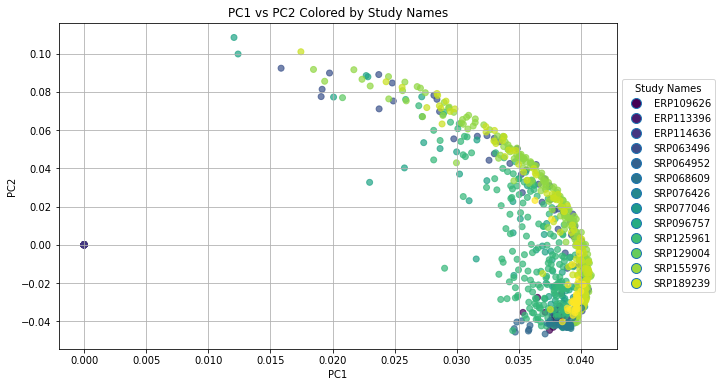

In [63]:
# Extract principal components and sample names
study_names = data.iloc[:, 0]
sample_names = data.iloc[:, 2]
pc1 = data.iloc[:, -15]
pc2 = data.iloc[:, -14]

# Determine unique studies and their indices
unique_studies = np.unique(study_names)
color_mapping = {study: i for i, study in enumerate(unique_studies)}

# Assign colors based on unique studies
colors = [color_mapping[study] for study in study_names]

# Plot PC1 vs. PC2 and color by study names
plt.figure(figsize=(10, 6))
scatter = plt.scatter(pc1, pc2, c=colors, cmap='viridis', alpha=0.7)

# Create legend handles and labels grouped by study
legend_handles = []
for study in unique_studies:
    color = plt.cm.viridis(color_mapping[study] / len(unique_studies))
    legend_handles.append(plt.Line2D([], [], marker='o', linestyle='None', markersize=10, markerfacecolor=color, label=study))

# Add legend with grouped items
plt.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1, 0.5), title='Study Names')

# Add colorbar
# plt.colorbar(scatter, ticks=[], label='Sample Names')

plt.title('PC1 vs PC2 Colored by Study Names')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.show()

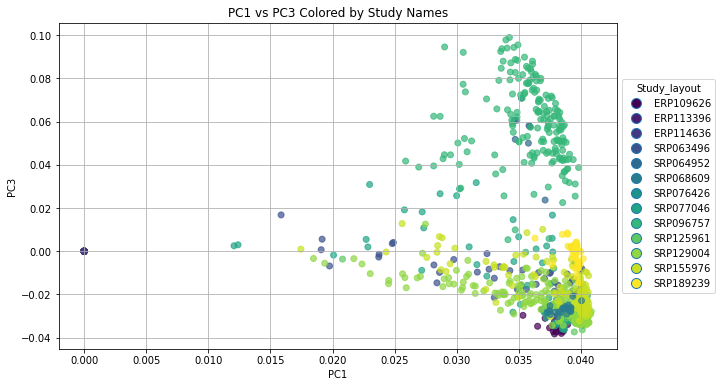

In [71]:
import matplotlib.pyplot as plt
import numpy as np

# Assume data is already loaded into 'data'
# Extract principal components and sample names
study_names = data.iloc[:, 0]
study_layout = data.iloc[:, 1]
sample_names = data.iloc[:, 2]
pc1 = data.iloc[:, -15]
pc2 = data.iloc[:, -13]

# Determine unique studies and their indices
unique_studies = np.unique(study_names)
color_mapping = {study: i for i, study in enumerate(unique_studies)}

# Assign colors based on unique studies, normalized by the number of unique studies
colors = [color_mapping[study] / (len(unique_studies) - 1) for study in study_names]

# Plot PC1 vs. PC2 and color by study names
plt.figure(figsize=(10, 6), facecolor='white')
scatter = plt.scatter(pc1, pc2, c=colors, cmap='viridis', alpha=0.7)

# Create legend handles and labels grouped by study
legend_handles = []
for study in unique_studies:
    color = plt.cm.viridis(color_mapping[study] / (len(unique_studies) - 1))
    legend_handles.append(plt.Line2D([], [], marker='o', linestyle='None', markersize=10, markerfacecolor=color, label=study))

# Add legend with grouped items
plt.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1, 0.5), title='Study_layout')

# Add colorbar if needed
# plt.colorbar(scatter, ticks=[], label='Sample Names')

plt.title('PC1 vs PC3 Colored by Study Names')
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.grid(True)

plt.show()


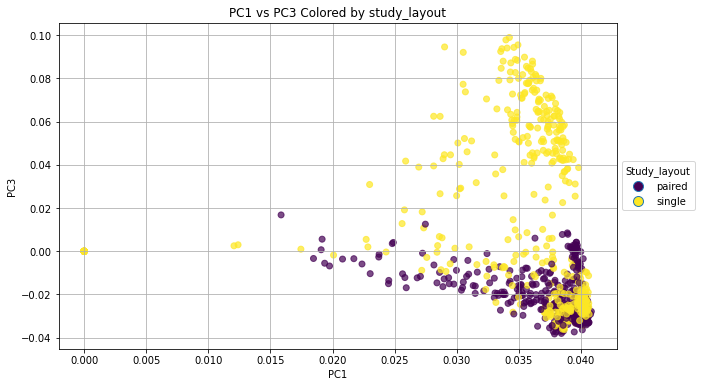

In [73]:
# Assume data is already loaded into 'data'
# Extract principal components and sample names
study_names = data.iloc[:, 0]
study_layout = data.iloc[:, 1]
sample_names = data.iloc[:, 2]
pc1 = data.iloc[:, -15]
pc2 = data.iloc[:, -13]

# Determine unique studies and their indices
unique_studies = np.unique(study_layout)
color_mapping = {study: i for i, study in enumerate(unique_studies)}

# Assign colors based on unique studies, normalized by the number of unique studies
colors = [color_mapping[study] / (len(unique_studies) - 1) for study in study_layout]

# Plot PC1 vs. PC2 and color by study names
plt.figure(figsize=(10, 6), facecolor='white')
scatter = plt.scatter(pc1, pc2, c=colors, cmap='viridis', alpha=0.7)

# Create legend handles and labels grouped by study
legend_handles = []
for study in unique_studies:
    color = plt.cm.viridis(color_mapping[study] / (len(unique_studies) - 1))
    legend_handles.append(plt.Line2D([], [], marker='o', linestyle='None', markersize=10, markerfacecolor=color, label=study))

# Add legend with grouped items
plt.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1, 0.5), title='Study_layout')

# Add colorbar if needed
# plt.colorbar(scatter, ticks=[], label='Sample Names')

plt.title('PC1 vs PC3 Colored by study_layout')
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.grid(True)

plt.show()

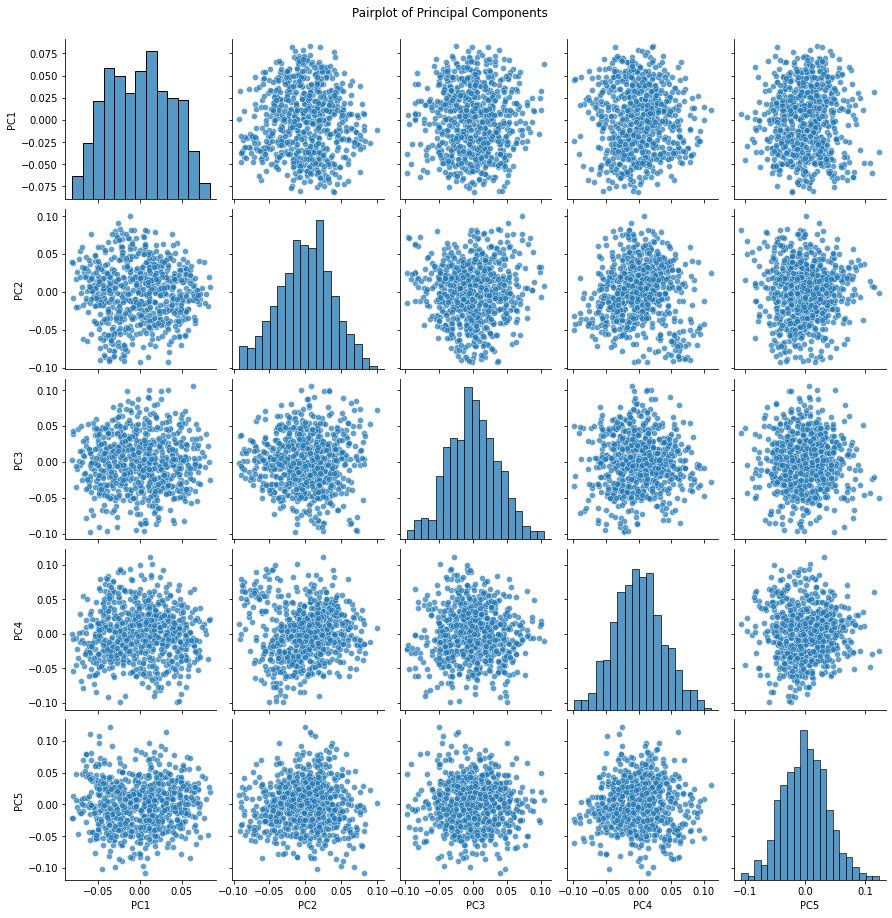

In [5]:
# Extract principal components
pc_columns = data2.columns[1:6]
pcs = data2[pc_columns]


# Create a pairplot with Seaborn
pairplot = sns.pairplot(pcs, plot_kws={'alpha':0.7})

# Set the background color to white
pairplot.fig.patch.set_facecolor('white')
for ax in pairplot.axes.flatten():
    ax.set_facecolor('white')

# Customize plot
pairplot.fig.suptitle('Pairplot of Principal Components', y=1.02)
plt.show()

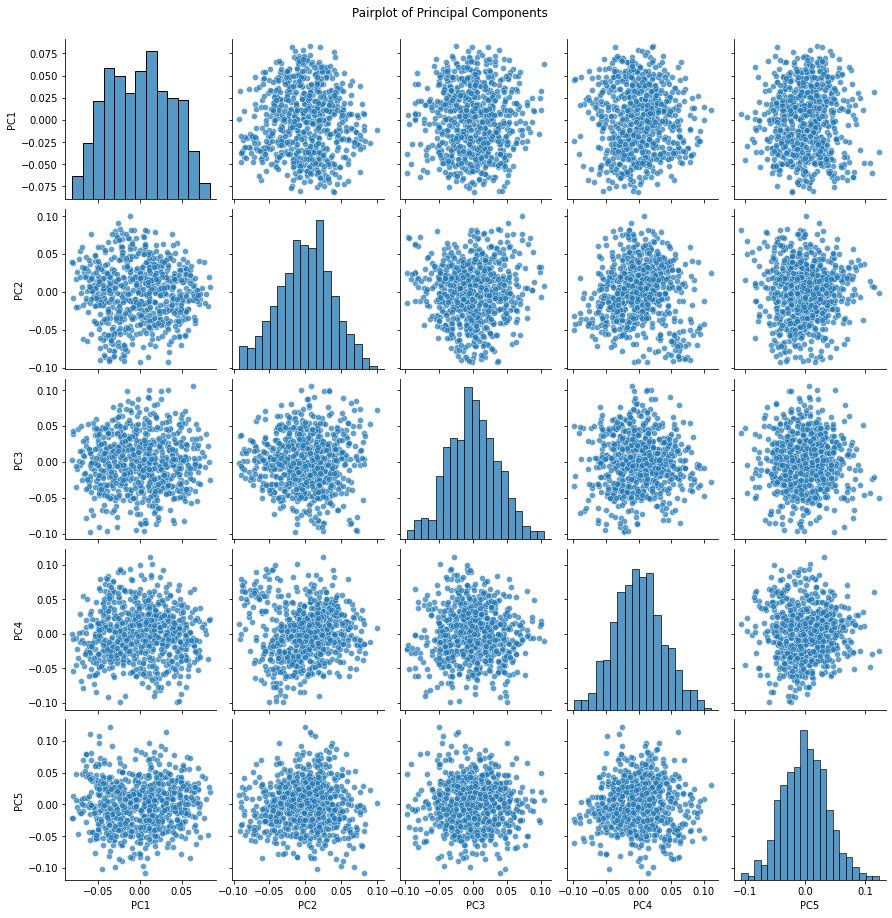

In [6]:
# Extract principal components
pc_columns = data3.columns[1:6]
pcs = data3[pc_columns]


# Create a pairplot with Seaborn
pairplot = sns.pairplot(pcs, plot_kws={'alpha':0.7})

# Set the background color to white
pairplot.fig.patch.set_facecolor('white')
for ax in pairplot.axes.flatten():
    ax.set_facecolor('white')

# Customize plot
pairplot.fig.suptitle('Pairplot of Principal Components', y=1.02)
plt.show()

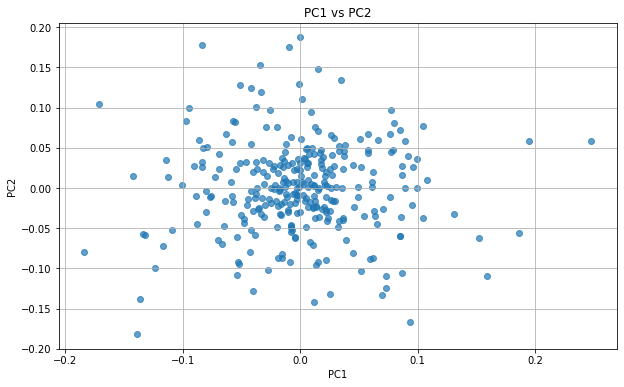

In [19]:
# Assume data is already loaded into 'data'
# Extract principal components and sample names
pc1 = data2.iloc[:, -15]
pc2 = data2.iloc[:, -14]

# Plot PC1 vs. PC2 and color by study names
plt.figure(figsize=(10, 6), facecolor='white')
scatter = plt.scatter(pc1, pc2, alpha=0.7)

# Add colorbar if needed
# plt.colorbar(scatter, ticks=[], label='Sample Names')

plt.title('PC1 vs PC2')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.show()

In [8]:
metrics = pd.read_csv("/scratch/hb-functionalgenomics/projects/gut-bulk/ongoing/2024-02-07-GutPublicRNASeq/5-expressieQC/all_alignment_output/alignment_metrics_with_study.txt.gz", sep="\t")
metrics = metrics.sort_values(by="Study")
metrics

,Study,Sample,PCT_CODING_BASES,PCT_PF_READS_ALIGNED
470,ERP109626,ERR2675475,0.421714,0.779588
322,ERP109626,ERR2675428,0.450210,0.736221
363,ERP109626,ERR2675471,0.377935,0.670699
700,ERP109626,ERR2675445,0.436749,0.747128
576,ERP109626,ERR2675482,0.483204,0.637998
...,...,...,...,...
64,SRP189239,SRR8774205,0.374642,0.890376
393,SRP189239,SRR8774212,0.408986,0.887609
59,SRP189239,SRR8774201,0.358050,0.872712
685,SRP189239,SRR8774203,0.368109,0.877915


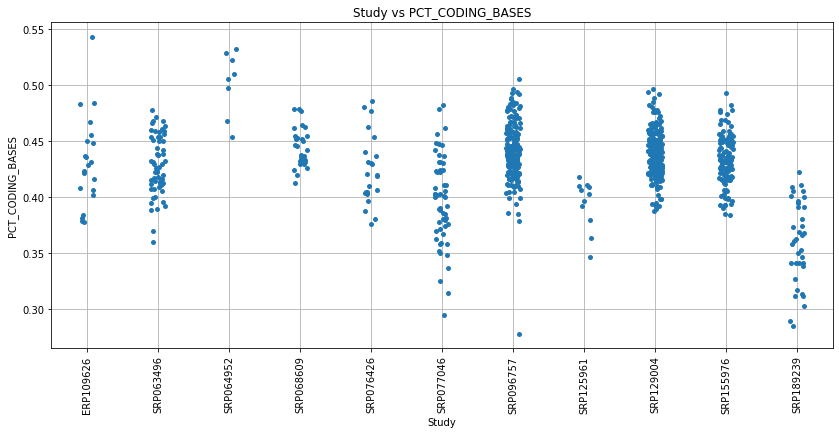

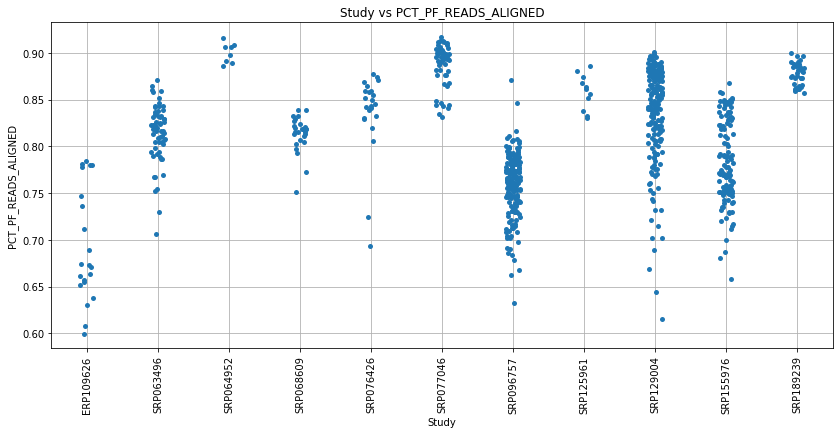

In [12]:
# Plotting Study vs PCT_CODING_BASES
plt.figure(figsize=(14, 6))
sns.stripplot(x='Study', y='PCT_CODING_BASES', data=metrics, jitter=True)
plt.title('Study vs PCT_CODING_BASES')
plt.xlabel('Study')
plt.ylabel('PCT_CODING_BASES')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# Plotting Study vs PCT_PF_READS_ALIGNED
plt.figure(figsize=(14, 6))
sns.stripplot(x='Study', y='PCT_PF_READS_ALIGNED', data=metrics, jitter=True)
plt.title('Study vs PCT_PF_READS_ALIGNED')
plt.xlabel('Study')
plt.ylabel('PCT_PF_READS_ALIGNED')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

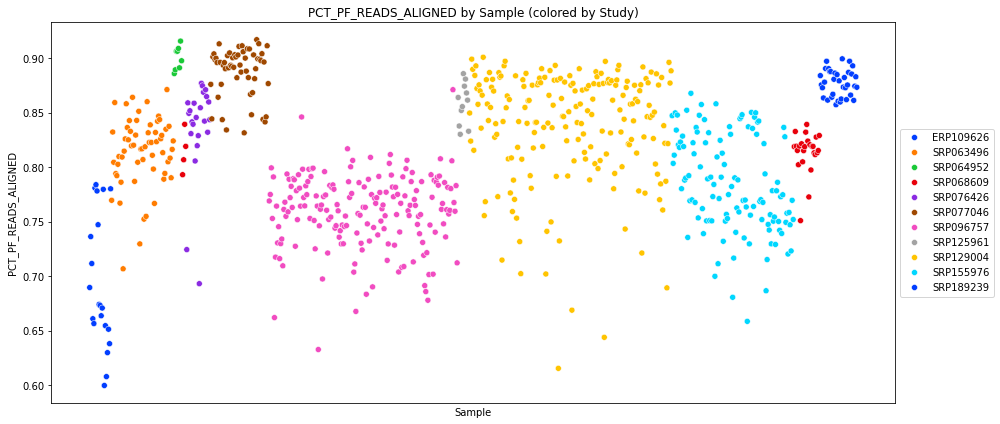

In [40]:
# Sort the DataFrame by 'Sample' column alphabetically
metrics_sorted = metrics.sort_values(by='Sample')

# Set up the plots
plt.figure(figsize=(14, 6))  # Adjust the figure size if necessary

# Use seaborn's scatterplot to color by 'Study' column
sns.scatterplot(x='Sample', y='PCT_PF_READS_ALIGNED', hue='Study', data=metrics_sorted, palette='bright')

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45, ha='right')

# Add labels and title
plt.xlabel('Sample')
plt.ylabel('PCT_PF_READS_ALIGNED')
plt.title('PCT_PF_READS_ALIGNED by Sample (colored by Study)')

# Show legend
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xticks([])

# Show plot
plt.tight_layout()
plt.show()

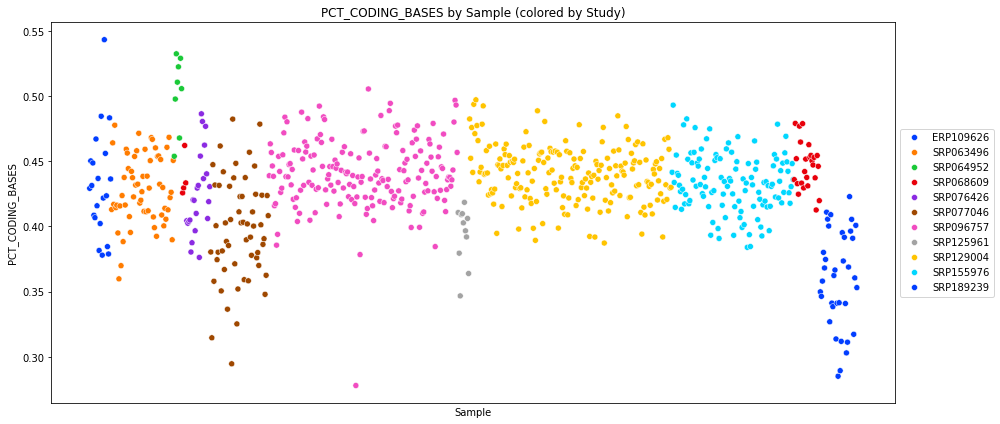

In [39]:
# Sort the DataFrame by 'Sample' column alphabetically
metrics_sorted = metrics.sort_values(by='Sample')

# Set up the plots
plt.figure(figsize=(14, 6))  # Adjust the figure size if necessary

# Use seaborn's scatterplot to color by 'Study' column
sns.scatterplot(x='Sample', y='PCT_CODING_BASES', hue='Study', data=metrics_sorted, palette='bright')

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45, ha='right')
# plt.axhline(y = 0.35, color = 'r', linestyle = '-') 

# Add labels and title
plt.xlabel('Sample')
plt.ylabel('PCT_CODING_BASES')
plt.title('PCT_CODING_BASES by Sample (colored by Study)')

# Show legend
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xticks([])

# Show plot
plt.tight_layout()
plt.show()